In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

In [5]:
df_cleaned=pd.read_csv(r"C:\Users\Raju\Downloads\final_df_olist.csv",parse_dates=["order_purchase_timestamp","order_delivered_carrier_date","order_approved_at","order_delivered_customer_date","order_estimated_delivery_date","shipping_limit_date","review_creation_date","review_answer_timestamp"])

In [7]:
df_cleaned

,Row_No,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_name_lenght,product_description_lenght,...,payment_type,payment_installments,payment_value,product_category_name_english,seller_lat,seller_lng,customer_lat,customer_lng,product_category,cust_Region
0,0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:00,58.90,13.29,58,598,...,credit_card,2,72.19,cool_stuff,-22.497188,-44.127324,-21.763186,-41.310265,Fashion,Southeast
1,1,5c94ad4e194c0e6794688a9d2b9ea94b,1,e0cf79767c5b016251fe139915c59a26,da8622b14eb17ae2831f4ac5b9dab84a,2018-03-16 18:50:00,29.90,18.23,55,388,...,boleto,1,48.13,health_beauty,-22.708485,-47.664918,-21.763186,-41.310265,Health and Beauty,Southeast
2,2,bd31b009e1dbc47fc7c250b1e2cf5440,1,92e2d2146e433cd4d1f09a3f8633ead0,4a3ca9315b744ce9f8e9374361493884,2018-05-02 03:51:00,52.90,22.95,53,714,...,boleto,1,75.85,bed_bath_table,-21.757225,-48.829541,-21.763186,-41.310265,Furniture,Southeast
3,3,bb4eb0196897c20281a61f75ce23211c,1,8cee1d824765335c48ccc515c2ecf4b8,4a3ca9315b744ce9f8e9374361493884,2017-07-28 14:50:00,96.00,15.42,54,385,...,credit_card,9,111.42,bed_bath_table,-21.757225,-48.829541,-21.763186,-41.310265,Furniture,Southeast
4,4,f9847bf9cc7336c6ba07fe2bdbb6cae1,1,3e5201fe0d1ba474d9b90152c83c706c,8160255418d5aaa7dbdc9f4c64ebda44,2018-05-16 18:30:00,125.90,13.30,56,255,...,credit_card,6,139.20,bed_bath_table,-21.757225,-48.829541,-21.763186,-41.310265,Furniture,Southeast
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112632,117720,bb05bd3bbacf1e3c6026b43b44a6631c,1,a0425426bd812474106a782b2979e310,eb1bf309f4f6af9a97e9ddac3fdbeabe,2018-05-29 02:55:00,22.30,8.88,57,1417,...,boleto,1,31.18,sports_leisure,-23.702611,-46.596395,-23.570953,-46.624567,Entertainment,Southeast
112633,117721,c003c1face3c31cba0af4ab5314f3332,1,dedb5adefe63796ce6edd624d0ebd8a8,70ee69419916dc13e3aed619061f996c,2017-08-18 11:05:00,45.00,8.72,43,642,...,credit_card,5,53.72,furniture_decor,-23.520595,-46.178266,-23.456257,-46.937905,Furniture,Southeast
112634,117725,cec79ef92819a9f1f2009e1d8cf26db8,1,ae8a92195eb75e94998a210eeb51693e,1d139e3a3b14025640d8df1b230aace0,2017-09-19 12:35:00,7.48,15.10,43,513,...,credit_card,2,22.58,sports_leisure,-21.190973,-48.156353,-17.086066,-42.255281,Entertainment,Southeast
112635,117726,e9613fa6e02ff8ae45f37ca30b0468a1,1,f619f125af192e28da946f3382e783a6,9b00cad94ef3078faf6fba2e792c158f,2017-12-27 12:17:00,354.90,18.92,53,234,...,voucher,1,250.00,sports_leisure,-15.801399,-43.310325,-27.101374,-51.246351,Entertainment,South


- Row_No: A unique number assigned to each row, acting as an index.
- order_id: A unique identifier for each customer order.
- order_item_id: Identifies the specific item within an order (useful for orders with multiple items).
- product_id: The unique ID for each product in the dataset.
- seller_id: A unique ID that represents the seller who sold the product.
- shipping_limit_date: The deadline for shipping the product.
- price: The price of the product purchased.
- freight_value: The shipping cost for delivering the product.
- product_name_lenght: The length of the product name (number of characters).
- product_description_lenght: The length of the product description (number of characters).
- payment_type: The method used to pay for the order (e.g., credit card, boleto).
- payment_installments: The number of payment installments chosen by the customer.
- payment_value: The total payment value made by the customer.
- product_category_name_english: The product category name (translated into English).
- seller_lat: The latitude of the seller's location (geographical coordinate).
- seller_lng: The longitude of the seller's location (geographical coordinate).
- customer_lat: The latitude of the customer's location (geographical coordinate).
- customer_lng: The longitude of the customer's location (geographical coordinate).
- product_category: Another way of categorizing the product into different groups (e.g., Fashion, Health and Beauty).
- cust_Region: The geographical region where the customer is located.

# Problem Statement: Enhancing E-commerce Performance through Data-Driven Insights

In [49]:
#df_cleaned.drop("Unnamed: 0",axis=1,inplace = True)

In [51]:
df_cleaned

,Row_No,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_name_lenght,product_description_lenght,...,payment_type,payment_installments,payment_value,product_category_name_english,seller_lat,seller_lng,customer_lat,customer_lng,product_category,cust_Region
0,0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:00,58.90,13.29,58,598,...,credit_card,2,72.19,cool_stuff,-22.497188,-44.127324,-21.763186,-41.310265,Fashion,Southeast
1,1,5c94ad4e194c0e6794688a9d2b9ea94b,1,e0cf79767c5b016251fe139915c59a26,da8622b14eb17ae2831f4ac5b9dab84a,2018-03-16 18:50:00,29.90,18.23,55,388,...,boleto,1,48.13,health_beauty,-22.708485,-47.664918,-21.763186,-41.310265,Health and Beauty,Southeast
2,2,bd31b009e1dbc47fc7c250b1e2cf5440,1,92e2d2146e433cd4d1f09a3f8633ead0,4a3ca9315b744ce9f8e9374361493884,2018-05-02 03:51:00,52.90,22.95,53,714,...,boleto,1,75.85,bed_bath_table,-21.757225,-48.829541,-21.763186,-41.310265,Furniture,Southeast
3,3,bb4eb0196897c20281a61f75ce23211c,1,8cee1d824765335c48ccc515c2ecf4b8,4a3ca9315b744ce9f8e9374361493884,2017-07-28 14:50:00,96.00,15.42,54,385,...,credit_card,9,111.42,bed_bath_table,-21.757225,-48.829541,-21.763186,-41.310265,Furniture,Southeast
4,4,f9847bf9cc7336c6ba07fe2bdbb6cae1,1,3e5201fe0d1ba474d9b90152c83c706c,8160255418d5aaa7dbdc9f4c64ebda44,2018-05-16 18:30:00,125.90,13.30,56,255,...,credit_card,6,139.20,bed_bath_table,-21.757225,-48.829541,-21.763186,-41.310265,Furniture,Southeast
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112632,117720,bb05bd3bbacf1e3c6026b43b44a6631c,1,a0425426bd812474106a782b2979e310,eb1bf309f4f6af9a97e9ddac3fdbeabe,2018-05-29 02:55:00,22.30,8.88,57,1417,...,boleto,1,31.18,sports_leisure,-23.702611,-46.596395,-23.570953,-46.624567,Entertainment,Southeast
112633,117721,c003c1face3c31cba0af4ab5314f3332,1,dedb5adefe63796ce6edd624d0ebd8a8,70ee69419916dc13e3aed619061f996c,2017-08-18 11:05:00,45.00,8.72,43,642,...,credit_card,5,53.72,furniture_decor,-23.520595,-46.178266,-23.456257,-46.937905,Furniture,Southeast
112634,117725,cec79ef92819a9f1f2009e1d8cf26db8,1,ae8a92195eb75e94998a210eeb51693e,1d139e3a3b14025640d8df1b230aace0,2017-09-19 12:35:00,7.48,15.10,43,513,...,credit_card,2,22.58,sports_leisure,-21.190973,-48.156353,-17.086066,-42.255281,Entertainment,Southeast
112635,117726,e9613fa6e02ff8ae45f37ca30b0468a1,1,f619f125af192e28da946f3382e783a6,9b00cad94ef3078faf6fba2e792c158f,2017-12-27 12:17:00,354.90,18.92,53,234,...,voucher,1,250.00,sports_leisure,-15.801399,-43.310325,-27.101374,-51.246351,Entertainment,South


# Data Exploration

## Data types and missing Values

In [55]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112637 entries, 0 to 112636
Data columns (total 46 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   Row_No                         112637 non-null  int64         
 1   order_id                       112637 non-null  object        
 2   order_item_id                  112637 non-null  int64         
 3   product_id                     112637 non-null  object        
 4   seller_id                      112637 non-null  object        
 5   shipping_limit_date            112637 non-null  datetime64[ns]
 6   price                          112637 non-null  float64       
 7   freight_value                  112637 non-null  float64       
 8   product_name_lenght            112637 non-null  int64         
 9   product_description_lenght     112637 non-null  int64         
 10  product_photos_qty             112637 non-null  int64         
 11  

In [57]:
df_cleaned.isnull().sum()

Row_No                           0
order_id                         0
order_item_id                    0
product_id                       0
seller_id                        0
shipping_limit_date              0
price                            0
freight_value                    0
product_name_lenght              0
product_description_lenght       0
product_photos_qty               0
product_weight_g                 0
product_length_cm                0
product_height_cm                0
product_width_cm                 0
seller_zip_code_prefix           0
seller_city                      0
seller_state                     0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
customer_unique_id               0
customer_zip_code_prefix         0
customer_city                    0
customer_state      

##  summary statistics

In [60]:
df_cleaned.describe()

,Row_No,order_item_id,shipping_limit_date,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,...,review_score,review_creation_date,review_answer_timestamp,payment_sequential,payment_installments,payment_value,seller_lat,seller_lng,customer_lat,customer_lng
count,112637.000000,112637.000000,112637,112637.000000,112637.000000,112637.000000,112637.000000,112637.000000,112637.000000,112637.000000,...,112637.000000,112637,112637,112637.000000,112637.000000,112637.000000,112637.000000,112637.000000,112637.000000,112637.000000
mean,58835.209745,1.195291,2018-01-07 23:06:50.781892096,119.874589,19.994517,48.790353,784.759946,2.201666,2104.531619,30.271314,...,4.082273,2018-01-13 14:17:41.555261440,2018-01-16 17:58:29.776006144,1.091107,2.941866,171.608144,-22.793484,-47.249447,-21.244581,-46.205748
min,0.000000,1.000000,2016-10-08 10:34:00,0.850000,0.000000,5.000000,4.000000,1.000000,0.000000,7.000000,...,1.000000,2016-10-15 00:00:00,2016-10-16 03:20:00,1.000000,0.000000,0.000000,-32.075303,-63.893789,-33.689890,-72.668821
25%,29429.000000,1.000000,2017-09-20 13:30:00,39.900000,13.070000,42.000000,345.000000,1.000000,300.000000,18.000000,...,4.000000,2017-09-26 00:00:00,2017-09-28 02:14:00,1.000000,1.000000,60.770000,-23.609666,-48.829541,-23.591175,-48.109939
50%,58869.000000,1.000000,2018-01-26 14:17:00,74.900000,16.310000,52.000000,600.000000,1.000000,700.000000,25.000000,...,5.000000,2018-02-02 00:00:00,2018-02-05 20:00:00,1.000000,2.000000,107.900000,-23.424361,-46.756262,-22.929004,-46.632945
75%,88256.000000,1.000000,2018-05-10 20:15:00,133.000000,21.180000,57.000000,982.000000,3.000000,1800.000000,38.000000,...,5.000000,2018-05-16 00:00:00,2018-05-20 15:12:00,1.000000,4.000000,189.150000,-21.757225,-46.522432,-20.197823,-43.658299
max,117727.000000,21.000000,2020-04-09 22:35:00,6735.000000,409.680000,76.000000,3992.000000,20.000000,40425.000000,105.000000,...,5.000000,2018-08-31 00:00:00,2018-10-29 12:27:00,26.000000,24.000000,13664.080000,-2.503158,-34.855831,42.184003,-8.723762
std,33957.398137,0.688436,NaN,181.266335,15.724954,10.020027,650.965951,1.713665,3759.828289,16.137837,...,1.346119,NaN,NaN,0.688242,2.778133,264.565310,2.703800,2.345108,5.555053,4.039360


## Unique Values Count of each Column

In [63]:
df_cleaned.nunique()

Row_No                           112637
order_id                          94002
order_item_id                        21
product_id                        31370
seller_id                          2900
shipping_limit_date               52788
price                              5755
freight_value                      6870
product_name_lenght                  65
product_description_lenght         2942
product_photos_qty                   19
product_weight_g                   2165
product_length_cm                    99
product_height_cm                   102
product_width_cm                     94
seller_zip_code_prefix             2126
seller_city                         587
seller_state                         22
customer_id                       94002
order_status                          2
order_purchase_timestamp          84349
order_approved_at                 48591
order_delivered_carrier_date      59768
order_delivered_customer_date     74069
order_estimated_delivery_date       444


# Data Visualization

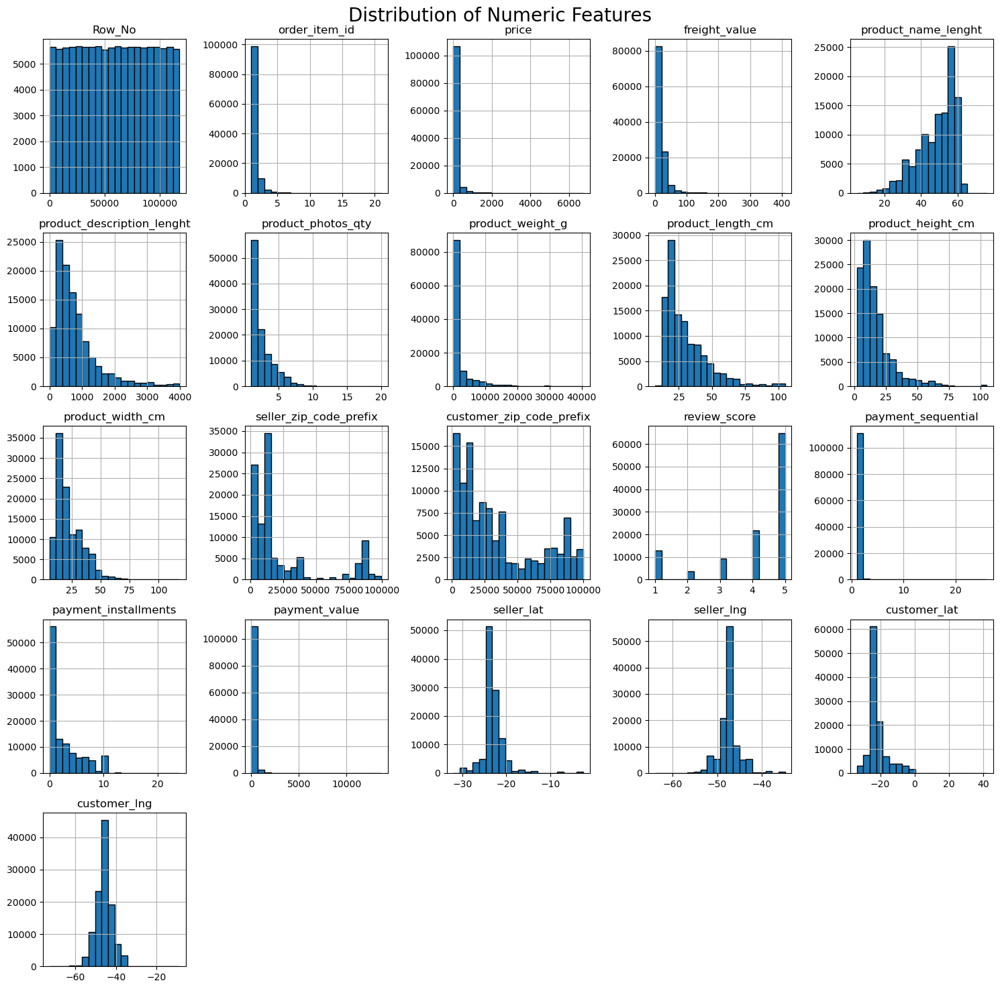

In [66]:
numeric_cols = df_cleaned.select_dtypes(include=[np.number]).columns
df_cleaned[numeric_cols].hist(figsize=(15, 15), bins=20, edgecolor='black')
plt.suptitle("Distribution of Numeric Features", fontsize=20)
plt.tight_layout()
plt.show()

- Order_item_id: Most values are concentrated at the lower end, specifically at 1. Indicates that most orders consist of a single item. 
- price: Positively skewed distribution with most values clustered below 1000. Few high-priced outliers.
- freight_value: Positively skewed distribution with most values concentrated below 100. There are some higher values, but they are less frequent.
- product_name_lenght: Distribution peaks around 50-60 characters. Indicates that most product names have moderate lengths.- product_description_lenght: Positively skewed with most values under 1000 characters. Some longer descriptions are present but are rare.
- product_photos_qty:Most products have around 1-2 photos. Few products have more than 5 photos.
- product_weight_g: Positively skewed with most values below 2000 grams. Some heavier products are present but not common.
- product_length_cm: Positively skewed with most products having lengths below 50 cm. Few products are longer.
- product_height_cm: Positively skewed with most products having heights below 20 cm. Some products are taller, but they are rare.
- product_width_cm: Positively skewed with most products having widths below 30 cm. Few wider products exist.
- seller_zip_code_prefix: Diverse range of values indicating a wide geographical distribution of sellers. Some clustering around specific zip codes.
- customer_zip_code_prefix: Diverse range of values indicating a wide geographical distribution of customers. Some clustering around specific zip codes.
- review_score: Distribution shows a higher frequency of positive scores (4 and 5). Few low scores (1 and 2), indicating overall positive customer feedback.
- payment_sequential: Positively skewed with most values at the lower end. Indicates the sequence of payments with the majority being initial payments.
- payment_installments: Positively skewed with most transactions having fewer installments. Some transactions have many installments, but they are rare.
- payment_value: Positively skewed with most payments concentrated below 2000. Few higher payment values are present.
- seller_lat and seller_lng: Distribution indicates the geographical spread of sellers, with some clustering.
- customer_lat and customer_lng: Distribution indicates the geographical spread of customers, with some clustering.

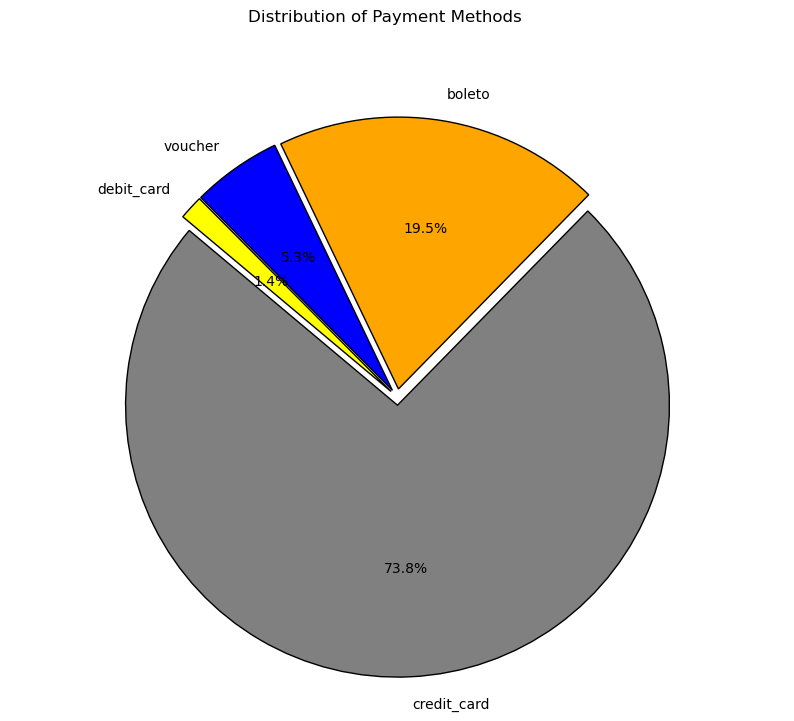

In [69]:
explode = [0.1]
payment_trends = df_cleaned['payment_type'].value_counts().reset_index()
payment_trends.columns = ['payment_type', 'count']
plt.figure(figsize=(10, 8))
plt.pie(payment_trends['count'], labels=payment_trends['payment_type'], autopct='%1.1f%%', startangle=140, explode = [0.03,0.03,0.03,0.03],colors = ["gray","orange","blue","yellow"] ,wedgeprops={'edgecolor': 'black', 'linewidth': 1.0})
plt.axis('equal')  # Equal aspect ratio ensures the pie chart is circular.
plt.suptitle('Distribution of Payment Methods')
plt.show()

- The pie chart shows the distribution of different payment methods used in transactions.
- Credit cards are the most popular payment method, accounting for 73.8% of all transactions. This indicates a strong preference for using credit cards among customers.
- Debit cards and vouchers are used much less frequently, with debit cards making up 1.4% and vouchers 5.3% of transactions.
- This suggests that these payment methods are not as favored by customers in comparison to credit cards and boleto.
- The high usage of credit cards, businesses might focus marketing efforts or promotions targeting credit card users to further leverage this preference.

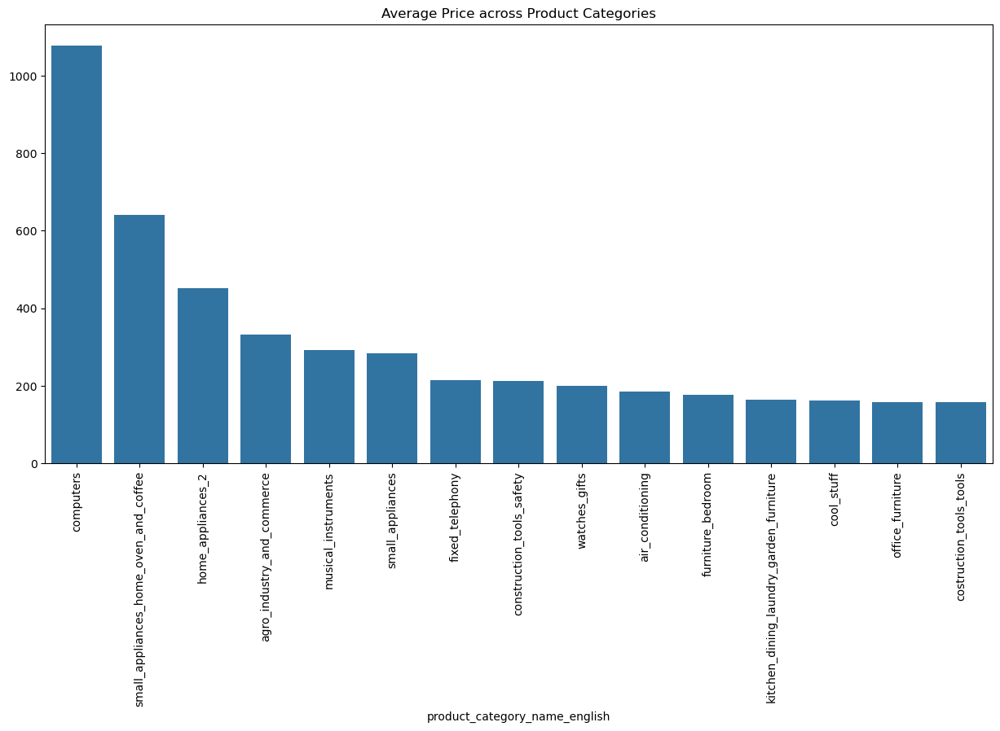

In [72]:
# Average price across different product categories
plt.figure(figsize=(15, 7))
avg_price_per_category = df_cleaned.groupby('product_category_name_english')['price'].mean().sort_values(ascending=False).head(15)
sns.barplot(x=avg_price_per_category.index, y=avg_price_per_category.values)
plt.xticks(rotation=90)
plt.title('Average Price across Product Categories')
plt.show()

- X-axis: Lists the top 15 product categories based on average price.
- Y-axis: Shows the average price in each category.
- 'electronics' or 'jewelry' appears at the top, it indicates that these categories have high-value items.
- Categories with higher average prices might have better profit margins, especially if the cost of goods sold (COGS) is relatively lower.
- 'Computer' listed at the top with high price and next to that home appliances points at 2 nd position.
- the products from air conditioning to the construction tools, there is a equal price for these products.

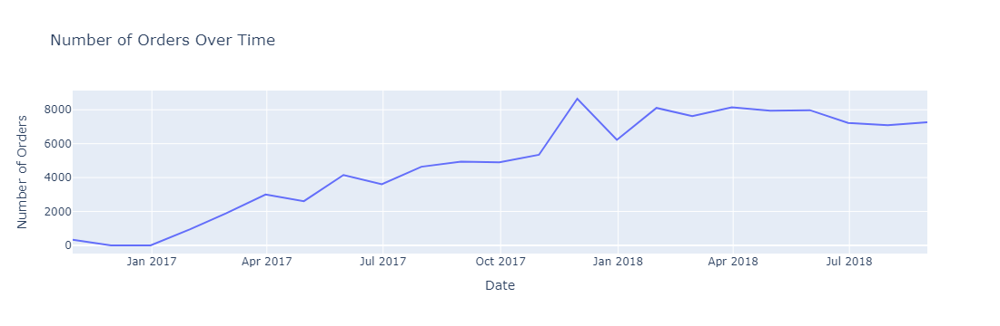

In [75]:
# Time series analysis for order purchase timestamp
df_cleaned['order_purchase_timestamp'] = pd.to_datetime(df_cleaned['order_purchase_timestamp'])
monthly_order_count = df_cleaned.set_index('order_purchase_timestamp').resample('M')['order_id'].count().reset_index()
fig = px.line(monthly_order_count, x='order_purchase_timestamp', y='order_id', title='Number of Orders Over Time')
fig.update_layout(xaxis_title='Date', yaxis_title='Number of Orders')
fig.show()

- The plot provides a clear visualization of the trend in the number of orders over time.
- Initially, the number of orders is relatively low.This could be due to the business ramping up or seasonal variations.
- Identified seasonal fluctuations at peaks in order numbers around specific months (e.g., November and December) might indicate holiday shopping seasons.
- The growth continues with some flucations over time between april to july months but within some days we can observe there is regrowth.
- finally, There’s consistent growth, it indicates a healthy business.



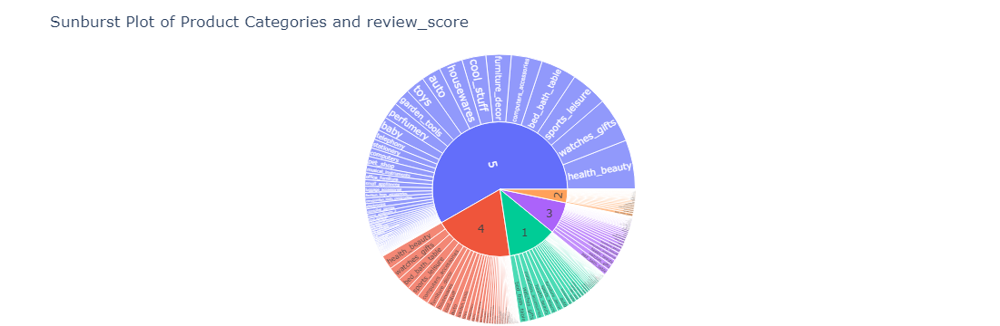

In [78]:

# Sunburst plot for product categories and their average prices
fig = px.sunburst(df_cleaned, path=["review_score",'product_category_name_english'], values='price', title='Sunburst Plot of Product Categories and review_score')
fig.update_layout(margin=dict(t=60, l=2, r=2, b=2))
fig.show()

- As we move innermost from the center, each ring represents subcategories within those main categories. The size of each segment (slice) reflects the average review score within that specific category.
- The outermost circle corresponds to the top-level product categories (e.g., electronics, fashion, home decor).
- As we can view the top product category like health beauty has review score 5.0, whereas the least review score 1.0 for bed bath table.
- The health products and electronics are the reviewed that means these are more selled in high quality.


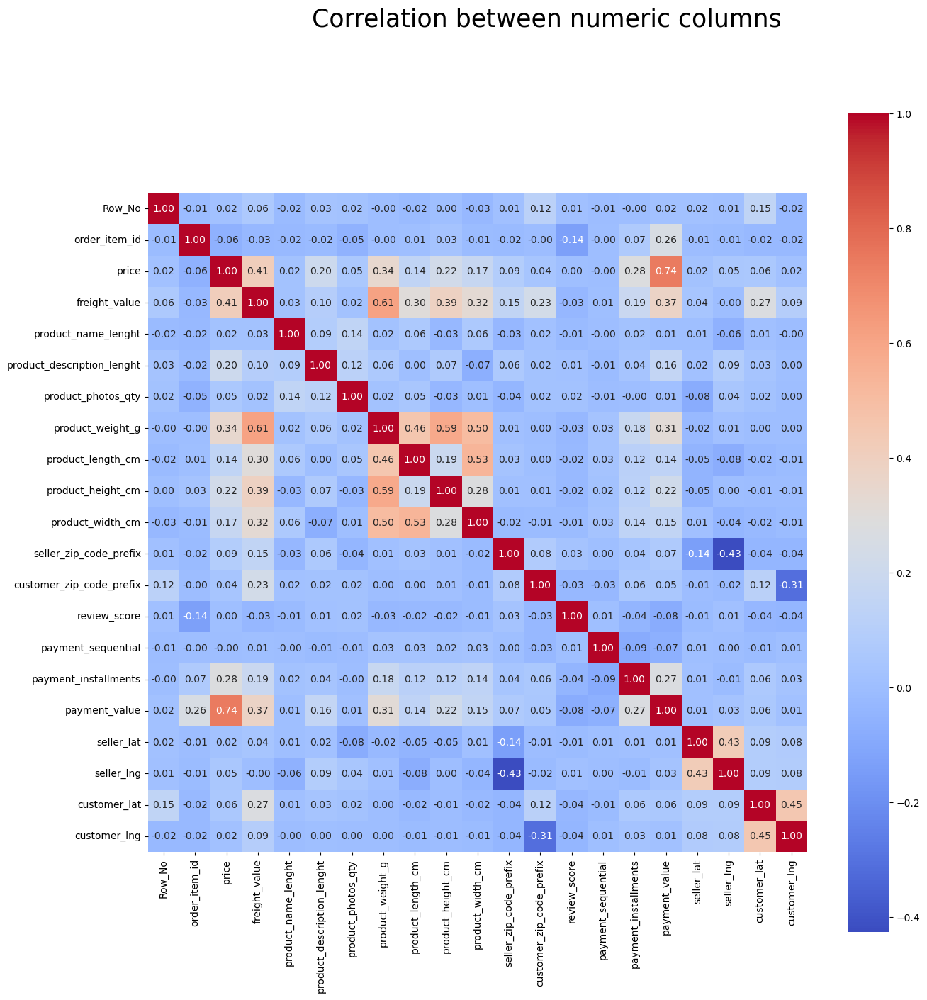

In [80]:
corr = df_cleaned[numeric_cols].corr()
plt.figure(figsize=(15, 15))
sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm', square=True)
plt.suptitle('Correlation between numeric columns',fontsize=25)
plt.show()

- The correlation coefficient between price and payment_value is 0.74, indicating that higher product prices are strongly associated with higher payment values.
- The correlation coefficient between product_weight_g and freight_value is 0.61, suggesting that heavier products generally incur higher shipping costs.
- There are moderate positive correlations between product_length_cm, product_height_cm, and product_width_cm. These correlations (around 0.5) suggest that larger dimensions in one aspect are generally associated with larger dimensions in others.
- The review_score has relatively low correlation coefficients with other variables, indicating that customer reviews are not strongly influenced.
- The correlation coefficients between product_weight_g and dimensions (product_length_cm, product_height_cm, product_width_cm) are moderately high (around 0.46 to 0.61).
- There is a weak negative correlation between customer_zip_code_prefix and seller_lat/seller_lng (around -0.43), which might reflect geographical distribution patterns of sellers and customers.
- The correlation between price and freight_value is 0.41, suggesting that more expensive items tend to have higher shipping costs, but this relationship is not very strong.
- The correlation between customer_lat and customer_lng is 0.45, indicating that customers are also clustered in particular regions.

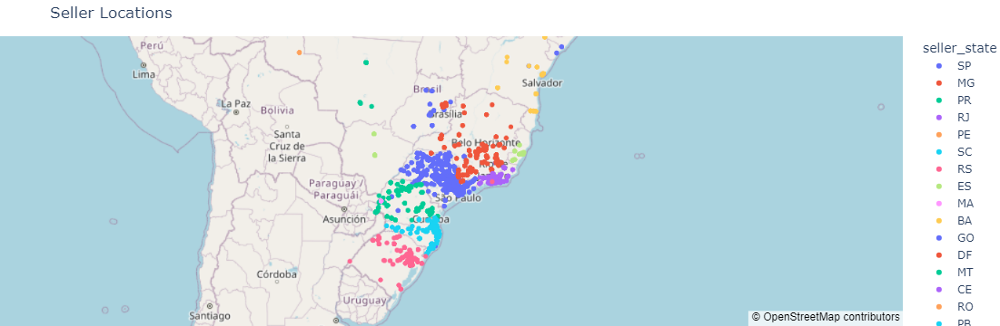

In [83]:

# Create the scatter mapbox plot for seller locations
fig = px.scatter_mapbox(df_cleaned,lat='seller_lat',lon='seller_lng',color='seller_state',hover_name='seller_city',zoom=3,mapbox_style="open-street-map", 
    title='Seller Locations')
fig.update_layout(margin=dict(t=40, l=0, r=0, b=0))

fig.show()



- The plot will show where sellers are geographically located. 

- We can notice that sellers are concentrated in specific urban areas, indicating that these regions are hubs for commerce and shipping.

- Urban areas are likely to have more sellers, reflecting better access to infrastructure and larger customer bases.

- Regions with fewer sellers might get opportunities for market expansion.

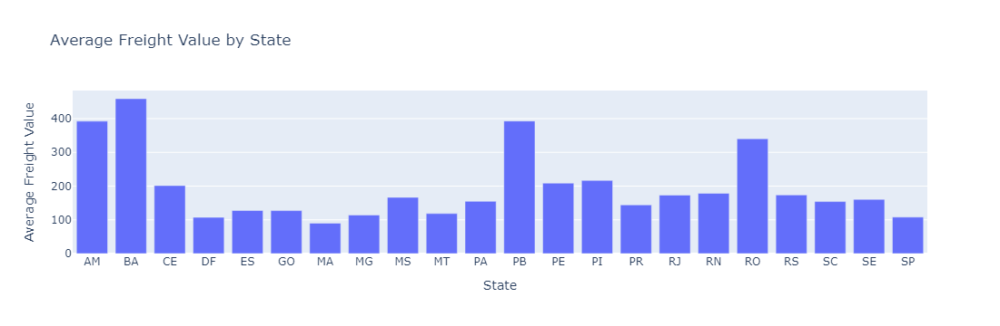

In [87]:
avg_freight_by_state = df_cleaned.groupby('seller_state')['price'].mean().reset_index()
fig = px.bar(avg_freight_by_state, x='seller_state', y='price', title='Average Freight Value by State')
fig.update_layout(xaxis_title='State', yaxis_title='Average Freight Value')
fig.show()


- A freight rate is a price at which a certain cargo is delivered from one point to another.
- As per the above diagram BA (Bahia) has the highest average freight value ,AM (Amazonas) and PB (Paraiba) has nearly 400 average value.
- AM (Amazonas) , PB (Paraiba) and RO (Rondonia) has average value between 300 to 400.
- CE (Ceara),PE (Pernambuco),PI (Piaui) has average value between 200 to 300.
- Remaning  all has average value between 100 to 200 expect MA (Maranhao)..
- MA (Maranhao) has very less average value it is below 100.
- BA (Bahia),AM (Amazonas), PB (Paraiba), and RO (Rondonia) have the highest average freight values, indicating higher shipping costs to these states.
- States like PE (Pernambuco), PI (Piaui), MS (Mato Grosso do Sul), and PA (Para) have moderate freight costs.
- SP (Sao Paulo),MG (Minas Gerais),PR (Parana),RS (Rio Grande do Sul),SC (Santa Catarina), and SE (Sergipe) have lower average freight values, suggesting lower shipping costs.

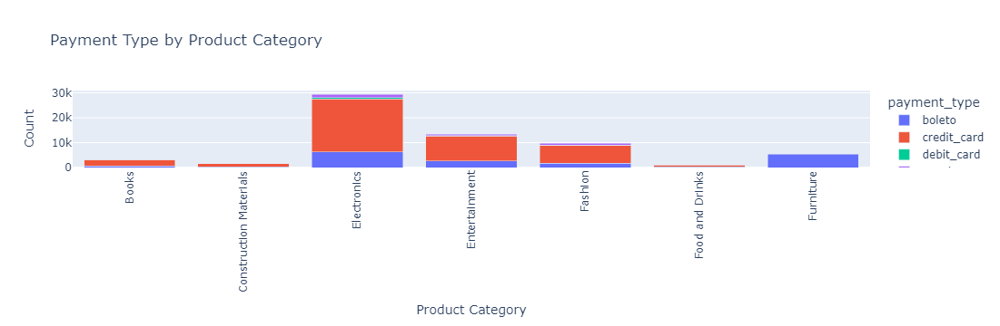

In [90]:
payment_type_by_category = df_cleaned.groupby(['product_category', 'payment_type']).size().reset_index(name='count').head(25)
fig = px.bar(payment_type_by_category, x='product_category', y='count', color='payment_type', title='Payment Type by Product Category', barmode='stack')
fig.update_layout(xaxis_title='Product Category', yaxis_title='Count', xaxis_tickangle=-90)
fig.show()


- The above plot is a stacked bar plot that describes about the what type of payment types are used for buying the products.
- Customers prefer more in credit card payment type in every category expect in furniture .
- In furniture category customers prefer only boleto payment type as per given data .
- Electronis,Entertainment and Fashions make more transcations as compared to other categories.
- Vouchar payment type is prefered very less as compared to other payment types.
- After voucher payment type debit cards payment type are prefered very less.
- Debit card payment type are used in only in 3 catogeries they are Electroincs,Enterainment,Fashion.

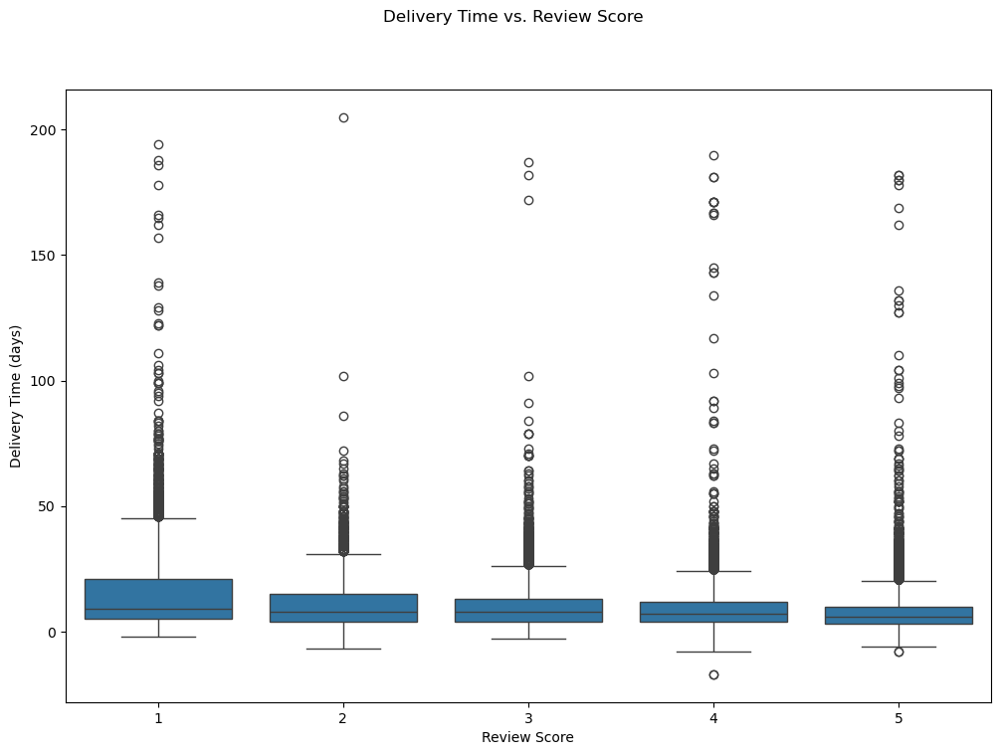

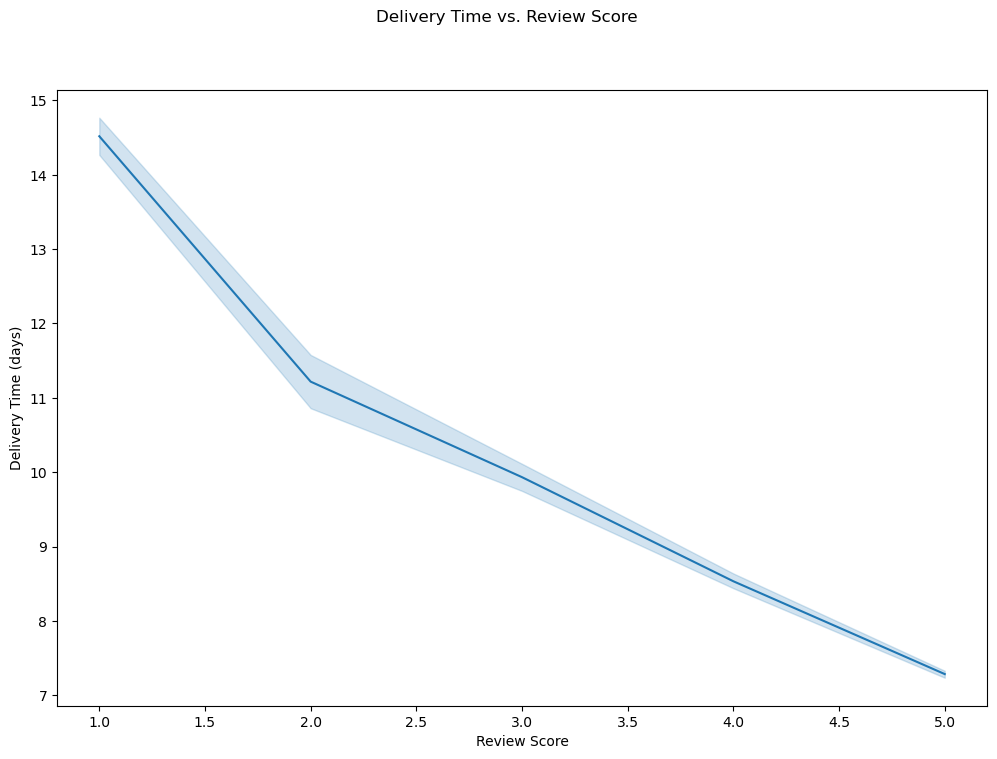

In [93]:
df_cleaned['order_purchase_timestamp'] = pd.to_datetime(df_cleaned['order_delivered_carrier_date'])
df_cleaned['order_delivered_customer_date'] = pd.to_datetime(df_cleaned['order_delivered_customer_date'])
df_cleaned['delivery_time'] = (df_cleaned['order_delivered_customer_date'] - df_cleaned['order_purchase_timestamp']).dt.days

# Plot
plt.figure(figsize=(12, 8))
sns.boxplot(x='review_score', y='delivery_time', data=df_cleaned)
plt.suptitle('Delivery Time vs. Review Score')
plt.xlabel('Review Score')
plt.ylabel('Delivery Time (days)')
plt.show()

# Plot
plt.figure(figsize=(12, 8))
sns.lineplot(x='review_score', y='delivery_time', data=df_cleaned)
plt.suptitle('Delivery Time vs. Review Score')
plt.xlabel('Review Score')
plt.ylabel('Delivery Time (days)')
plt.show()

##### Line Plot 
- The line plot shows the average delivery time across different review scores.
- As the delivery time increases, the review scores tend to decrease. This suggests that longer delivery times are associated with lower customer satisfaction.
- Higher review scores (4 and 5) are associated with shorter delivery times. Customers who received their orders quickly tend to give higher satisfaction scores.

##### Box plot
- The box plot provides a more detailed view of the distribution of delivery times for each review score, highlighting the median, quartiles, and potential outliers.
- There are noticeable outliers for all review scores, but more so for the lower scores.
- Reducing delivery times and improving consistency to enhance customer satisfaction and receive higher review scores.

### BI varient analysis

In [96]:
df_cleaned

,Row_No,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_name_lenght,product_description_lenght,...,payment_installments,payment_value,product_category_name_english,seller_lat,seller_lng,customer_lat,customer_lng,product_category,cust_Region,delivery_time
0,0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:00,58.90,13.29,58,598,...,2,72.19,cool_stuff,-22.497188,-44.127324,-21.763186,-41.310265,Fashion,Southeast,1
1,1,5c94ad4e194c0e6794688a9d2b9ea94b,1,e0cf79767c5b016251fe139915c59a26,da8622b14eb17ae2831f4ac5b9dab84a,2018-03-16 18:50:00,29.90,18.23,55,388,...,1,48.13,health_beauty,-22.708485,-47.664918,-21.763186,-41.310265,Health and Beauty,Southeast,29
2,2,bd31b009e1dbc47fc7c250b1e2cf5440,1,92e2d2146e433cd4d1f09a3f8633ead0,4a3ca9315b744ce9f8e9374361493884,2018-05-02 03:51:00,52.90,22.95,53,714,...,1,75.85,bed_bath_table,-21.757225,-48.829541,-21.763186,-41.310265,Furniture,Southeast,13
3,3,bb4eb0196897c20281a61f75ce23211c,1,8cee1d824765335c48ccc515c2ecf4b8,4a3ca9315b744ce9f8e9374361493884,2017-07-28 14:50:00,96.00,15.42,54,385,...,9,111.42,bed_bath_table,-21.757225,-48.829541,-21.763186,-41.310265,Furniture,Southeast,7
4,4,f9847bf9cc7336c6ba07fe2bdbb6cae1,1,3e5201fe0d1ba474d9b90152c83c706c,8160255418d5aaa7dbdc9f4c64ebda44,2018-05-16 18:30:00,125.90,13.30,56,255,...,6,139.20,bed_bath_table,-21.757225,-48.829541,-21.763186,-41.310265,Furniture,Southeast,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112632,117720,bb05bd3bbacf1e3c6026b43b44a6631c,1,a0425426bd812474106a782b2979e310,eb1bf309f4f6af9a97e9ddac3fdbeabe,2018-05-29 02:55:00,22.30,8.88,57,1417,...,1,31.18,sports_leisure,-23.702611,-46.596395,-23.570953,-46.624567,Entertainment,Southeast,2
112633,117721,c003c1face3c31cba0af4ab5314f3332,1,dedb5adefe63796ce6edd624d0ebd8a8,70ee69419916dc13e3aed619061f996c,2017-08-18 11:05:00,45.00,8.72,43,642,...,5,53.72,furniture_decor,-23.520595,-46.178266,-23.456257,-46.937905,Furniture,Southeast,3
112634,117725,cec79ef92819a9f1f2009e1d8cf26db8,1,ae8a92195eb75e94998a210eeb51693e,1d139e3a3b14025640d8df1b230aace0,2017-09-19 12:35:00,7.48,15.10,43,513,...,2,22.58,sports_leisure,-21.190973,-48.156353,-17.086066,-42.255281,Entertainment,Southeast,6
112635,117726,e9613fa6e02ff8ae45f37ca30b0468a1,1,f619f125af192e28da946f3382e783a6,9b00cad94ef3078faf6fba2e792c158f,2017-12-27 12:17:00,354.90,18.92,53,234,...,1,250.00,sports_leisure,-15.801399,-43.310325,-27.101374,-51.246351,Entertainment,South,18


In [97]:
df = df_cleaned.copy()

In [101]:
df['shipping_limit_date'] = pd.to_datetime(df['shipping_limit_date'])

In [103]:
total_sales = df['payment_value'].sum()
print(f'Total Sales: ${total_sales:.2f}')


Total Sales: $19329426.49


In [105]:
sales_by_category = df.groupby('product_category_name_english')['payment_value'].sum().reset_index()
sales_by_category = sales_by_category.sort_values(by='payment_value', ascending=False)

In [107]:
sales_by_category

,product_category_name_english,payment_value
7,bed_bath_table,1701732.74
43,health_beauty,1609125.37
15,computers_accessories,1547932.95
39,furniture_decor,1388837.77
70,watches_gifts,1373635.26
...,...,...
35,flowers,1922.77
46,home_comfort_2,1458.54
11,cds_dvds_musicals,1199.43
29,fashion_childrens_clothes,718.98


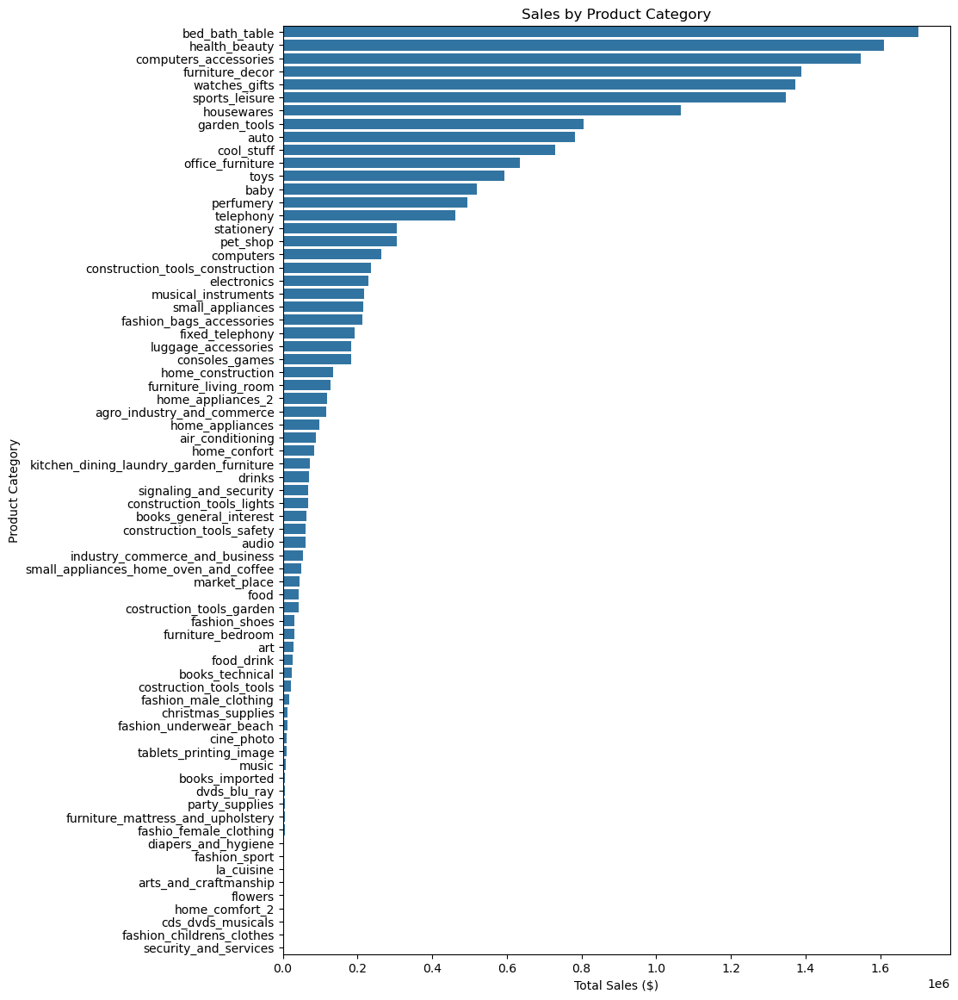

In [109]:
# Bar plot for sales by category
plt.figure(figsize=(10, 14))
sns.barplot(x='payment_value', y='product_category_name_english', data=sales_by_category)
plt.title('Sales by Product Category')
plt.xlabel('Total Sales ($)')
plt.ylabel('Product Category')
plt.show()

In [110]:
#Sales by Region
sales_by_region = df.groupby('cust_Region')['payment_value'].sum().reset_index()
sales_by_region = sales_by_region.sort_values(by='payment_value', ascending=False)

In [111]:
sales_by_region

,cust_Region,payment_value
4,Southeast,12551173.87
3,South,2860860.88
2,Northeast,2225156.70
0,Midwest,1233297.72
1,North,458937.32


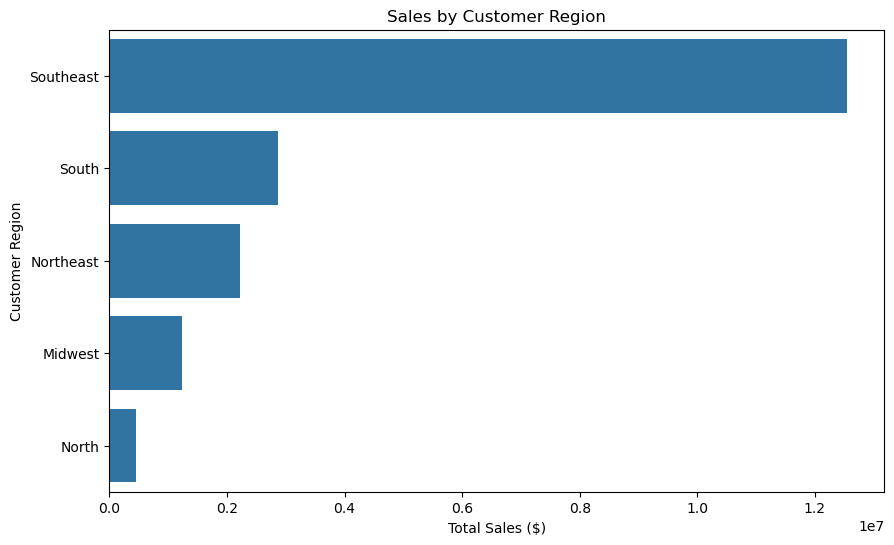

In [112]:
plt.figure(figsize=(10, 6))
sns.barplot(x='payment_value', y='cust_Region', data=sales_by_region)
plt.title('Sales by Customer Region')
plt.xlabel('Total Sales ($)')
plt.ylabel('Customer Region')
plt.show()

In [113]:
aov = df['payment_value'].mean()
print(f'Average Order Value (AOV): ${aov:.2f}')


Average Order Value (AOV): $171.61


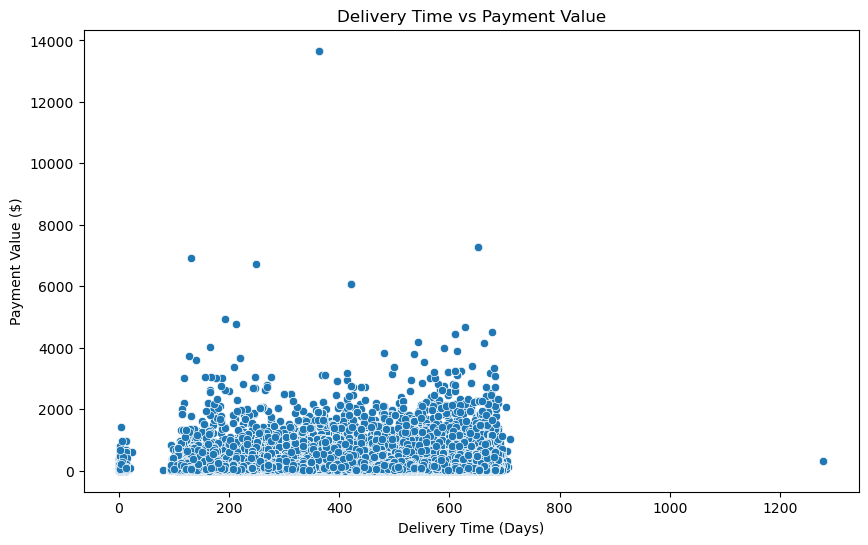

In [114]:
df['delivery_time'] = (df['shipping_limit_date'] - df['shipping_limit_date'].min()).dt.days  # Adjust this based on actual delivery date data if available
plt.figure(figsize=(10, 6))
sns.scatterplot(x='delivery_time', y='payment_value', data=df)
plt.title('Delivery Time vs Payment Value')
plt.xlabel('Delivery Time (Days)')
plt.ylabel('Payment Value ($)')
plt.show()

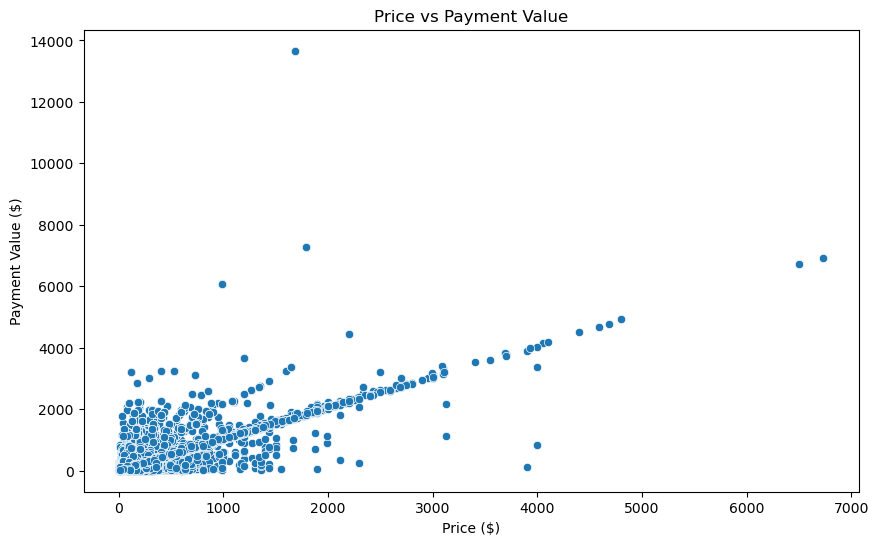

In [118]:
# Price Sensitivity Analysis
plt.figure(figsize=(10, 6))
sns.scatterplot(x='price', y='payment_value', data=df)
plt.title('Price vs Payment Value')
plt.xlabel('Price ($)')
plt.ylabel('Payment Value ($)')
plt.show()

In [121]:
sales_trend = df.groupby('month_year')['payment_value'].sum().reset_index()
sales_trend['growth_rate'] = sales_trend['payment_value'].pct_change() * 100

KeyError: 'month_year'

In [ ]:
sales_trend

In [ ]:
line_data = pd.DataFrame({
    'lat': df_cleaned[['seller_lat', 'customer_lat']].values.flatten(),
    'lng': df_cleaned[['seller_lng', 'customer_lng']].values.flatten(),
    'order_id': df_cleaned['order_id'].repeat(2).values,  # repeat for pairs of coordinates
    'cust_Region': df_cleaned['cust_Region'].repeat(2).values  # Optional for coloring
})

# Plot using plotly.express line_geo
fig = px.line_geo(line_data, 
                  lat='lat', 
                  lon='lng', 
                  color='cust_Region',  # Optional: color by region
                  line_group='order_id', 
                  title='Shipping Routes: Sellers to Customers')

# Customize layout
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

# Show the plot
fig.show()

In [ ]:
df_cleaned

###  1.Stastical anyalsis


In [ ]:
price_stats = df_cleaned['price'].describe()
freight_value_stats = df_cleaned['freight_value'].describe()

print(price_stats)
print(freight_value_stats)

### 2.Time Series Analysis (Order and Shipping Date Trends)

In [ ]:
df_cleaned['shipping_limit_date'] = pd.to_datetime(df_cleaned['shipping_limit_date'])

# Orders per month
orders_per_month = df_cleaned['shipping_limit_date'].dt.to_period('M').value_counts().sort_index()

print(orders_per_month)

###  3.Geospatial Analysis (Seller and Customer Locations)

In [ ]:
seller_location = df_cleaned[['seller_lat', 'seller_lng']].mean()
customer_location = df_cleaned[['customer_lat', 'customer_lng']].mean()

print("Seller Location (mean):", seller_location)
print("Customer Location (mean):", customer_location)

In [129]:
# Haversine formula for distance calculation
def haversine(lat1, lon1, lat2, lon2):
    R = 6371  # Radius of the Earth in kilometers
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    return R * c

# Calculate distance between sellers and customers
df_cleaned['distance_km'] = df_cleaned.apply(lambda row: haversine(row['seller_lat'], row['seller_lng'], row['customer_lat'], row['customer_lng']), axis=1)

print(df_cleaned[['seller_lat', 'seller_lng', 'customer_lat', 'customer_lng', 'distance_km']].head())


   seller_lat  seller_lng  customer_lat  customer_lng  distance_km
0  -22.497188  -44.127324    -21.763186    -41.310265   301.419473
1  -22.708485  -47.664918    -21.763186    -41.310265   662.391826
2  -21.757225  -48.829541    -21.763186    -41.310265   776.451059
3  -21.757225  -48.829541    -21.763186    -41.310265   776.451059
4  -21.757225  -48.829541    -21.763186    -41.310265   776.451059


### 4. Payment Methods and Value


In [131]:
# Payment method distribution
payment_type_counts = df_cleaned['payment_type'].value_counts()

# Correlation between payment installments and payment value
payment_corr = df_cleaned[['payment_installments', 'payment_value']].corr()


In [132]:
payment_type_counts

payment_type
credit_card    83097
boleto         21920
voucher         6002
debit_card      1618
Name: count, dtype: int64

In [133]:
payment_corr

,payment_installments,payment_value
payment_installments,1.000000,0.274597
payment_value,0.274597,1.000000


### 5. Category-Based Analysis


In [135]:
category_stats = df_cleaned.groupby('product_category_name_english').agg({'price': 'mean', 'payment_value': 'mean'})


In [136]:
category_stats

,price,payment_value
product_category_name_english,,
agro_industry_and_commerce,332.835691,470.049756
air_conditioning,185.349758,303.287163
art,117.130390,138.033659
arts_and_craftmanship,75.583750,96.923750
audio,139.272139,159.892380
...,...,...
stationery,90.220527,120.187802
tablets_printing_image,80.239176,105.710000
telephony,70.295931,101.545008


### 6. Correlation Analysis

In [138]:
# Correlation between price and freight value
price_freight_corr = df_cleaned[['price', 'freight_value']].corr()

# Correlation between product categories and payment value
category_payment_corr = df_cleaned[['product_category_name_english', 'payment_value']].groupby('product_category_name_english').mean()



In [139]:
price_freight_corr

,price,freight_value
price,1.000000,0.413091
freight_value,0.413091,1.000000


In [140]:
category_payment_corr


,payment_value
product_category_name_english,
agro_industry_and_commerce,470.049756
air_conditioning,303.287163
art,138.033659
arts_and_craftmanship,96.923750
audio,159.892380
...,...
stationery,120.187802
tablets_printing_image,105.710000
telephony,101.545008


### 7. Region-Based Analysis


In [142]:
# Grouping by customer region for average order value and product category distribution
region_analysis = df_cleaned.groupby('cust_Region').agg({'payment_value': 'mean', 'product_category_name_english': 'count'})
region_analysis


,payment_value,product_category_name_english
cust_Region,,
Midwest,193.034547,6389
North,225.411257,2036
Northeast,214.225156,10387
South,176.727260,16188
Southeast,161.664849,77637


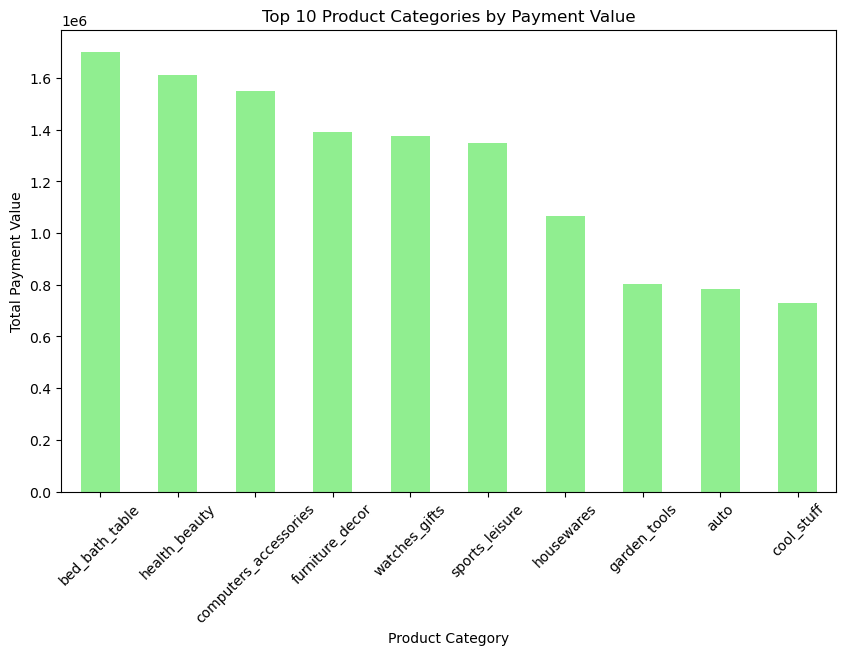

In [143]:
top_categories = df_cleaned.groupby('product_category_name_english')['payment_value'].sum().nlargest(10)

plt.figure(figsize=(10, 6))
top_categories.plot(kind='bar', color='lightgreen')
plt.title('Top 10 Product Categories by Payment Value')
plt.xlabel('Product Category')
plt.ylabel('Total Payment Value')
plt.xticks(rotation=45)
plt.show()

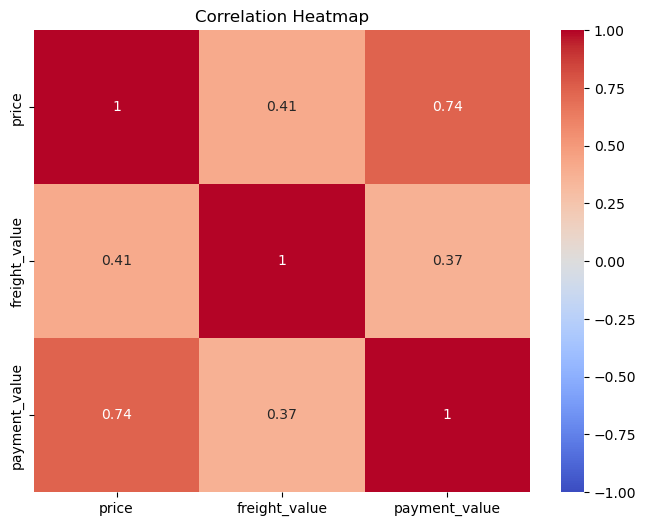

In [144]:
plt.figure(figsize=(8, 6))
sns.heatmap(df_cleaned[['price', 'freight_value', 'payment_value']].corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()

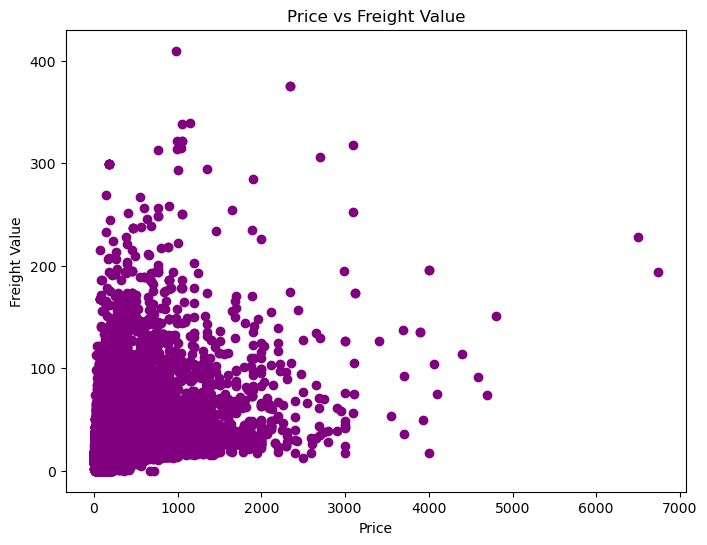

In [145]:
plt.figure(figsize=(8, 6))
plt.scatter(df_cleaned['price'], df_cleaned['freight_value'], color='purple')
plt.title('Price vs Freight Value')
plt.xlabel('Price')
plt.ylabel('Freight Value')
plt.show()

In [159]:
import folium
import os
import webbrowser
from IPython.display import IFrame

# Initialize a map centered on Brazil (adjust latitude and longitude accordingly)
m = folium.Map(location=[-14.2350, -51.9253], zoom_start=5)

# Add customer locations as markers
for index, row in df_cleaned.iterrows():
    folium.Marker([row['customer_lat'], row['customer_lng']], popup=row['cust_Region']).add_to(m)

# Save the map as an HTML file
map_filename = 'customer_locations_map.html'
m.save(map_filename)

# Display the map directly in the Jupyter Notebook
display(IFrame(map_filename, width=800, height=600))

# Optional: Open the saved map in the default web browser
file_path = os.path.abspath(map_filename)
webbrowser.open(f'file://{file_path}')


True

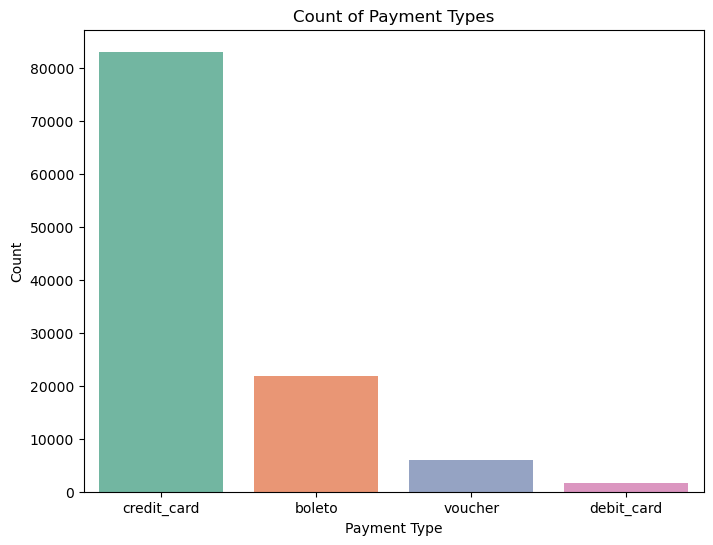

In [160]:
plt.figure(figsize=(8, 6))
sns.countplot(x='payment_type', data=df_cleaned, palette='Set2')
plt.title('Count of Payment Types')
plt.xlabel('Payment Type')
plt.ylabel('Count')
plt.show()

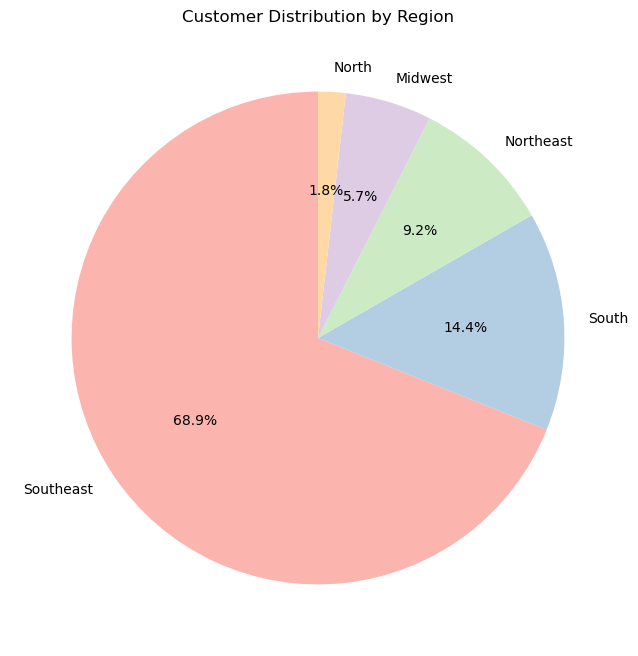

In [161]:
# Pie chart for customer regional distribution
customer_region_counts = df_cleaned['cust_Region'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(customer_region_counts, labels=customer_region_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Pastel1'))
plt.title('Customer Distribution by Region')
plt.show()